# GenesisLung

GenesisLung is a specific version of Models Genesis, focusing on pre-training 3D U-Net from a wide variety of chest ct datasets. This notebook shows online data loaders for these datasets:

- luna16
- dsb17
- lits17
- lndb19
- kits19
- rsnastr20
- ctpa (private dataset)

Before using the data loaders, download the raw datasets online and update the data directory in the config.

In [1]:
from config import models_genesis_config
from datetime import datetime
from utils import *

class set_args():
    data = None
    weights = None
args = set_args()
conf = models_genesis_config(args=args)
conf.display()


Configurations:
batch_size                     12
crop_cols_max                  128
crop_cols_min                  32
crop_deps_max                  64
crop_deps_min                  16
crop_rows_max                  128
crop_rows_min                  32
ctpa_data                      /mnt/dataset/Lung/PE/PE_detection_2016/dicom
datasets                       ['luna16', 'ctpa', 'dsb17', 'lits17', 'lndb19', 'kits19', 'rsnastr20']
dsb17_data                     /mnt/dataset/shared/zongwei/dsb2017/dsb2017-lung-data/stage1-mnt
exp_name                       Vnet-genesis_chest_ct
flip_rate                      0.4
hu_max                         1000.0
hu_min                         -1000.0
hu_thred                       0.425
inpaint_rate                   0.19999999999999996
input_cols                     64
input_deps                     32
input_rows                     64
kits19_data                    /mnt/dataset/shared/zongwei/kits19
len_vision                     3
lits17_data    

# Efficiency analysis

+ luna16

In [ ]:
for _ in range(100):
    start_time = datetime.now()
    vol = lndb19_data_loader(conf)
    time_elapsed = datetime.now() - start_time 
    print('{} | (hh:mm:ss.ms) {}'.format(vol.shape, time_elapsed))
    
    start_time = datetime.now()
    subvol = generate_subvolume(conf, vol)
    time_elapsed = datetime.now() - start_time 
    print('{} | (hh:mm:ss.ms) {}\n'.format(subvol.shape, time_elapsed))

(512, 512, 373) | (hh:mm:ss.ms) 0:00:05.204842
(6, 64, 64, 64) | (hh:mm:ss.ms) 0:00:00.190135

(512, 692, 302) | (hh:mm:ss.ms) 0:00:06.117286
(6, 64, 64, 64) | (hh:mm:ss.ms) 0:00:00.202602

(512, 512, 373) | (hh:mm:ss.ms) 0:00:04.917413
(6, 64, 64, 64) | (hh:mm:ss.ms) 0:00:00.196171

(512, 512, 328) | (hh:mm:ss.ms) 0:00:04.192555
(6, 64, 64, 64) | (hh:mm:ss.ms) 0:00:00.185019

(512, 660, 349) | (hh:mm:ss.ms) 0:00:04.890833
(6, 64, 64, 64) | (hh:mm:ss.ms) 0:00:00.200368

(512, 512, 368) | (hh:mm:ss.ms) 0:00:05.383500
(6, 64, 64, 64) | (hh:mm:ss.ms) 0:00:00.316479

(512, 512, 344) | (hh:mm:ss.ms) 0:00:04.383522
(6, 64, 64, 64) | (hh:mm:ss.ms) 0:00:00.196638

(512, 721, 285) | (hh:mm:ss.ms) 0:00:03.227925
(6, 64, 64, 64) | (hh:mm:ss.ms) 0:00:00.199678

(512, 666, 276) | (hh:mm:ss.ms) 0:00:03.235341
(6, 64, 64, 64) | (hh:mm:ss.ms) 0:00:00.201160



# On-the-fly CT readers and sub-volume generators

In [3]:
vol = luna16_data_loader(conf)
subvol = generate_subvolume(conf, vol)
print('\nluna16')
print('vol:    {} | {:.2f} ~ {:.2f}'.format(vol.shape, np.min(vol), np.max(vol)))
print('subvol: {} | {:.2f} ~ {:.2f}'.format(subvol.shape, np.min(subvol), np.max(subvol)))

vol = kits19_data_loader(conf)
subvol = generate_subvolume(conf, vol)
print('\nkits19')
print('vol:    {} | {:.2f} ~ {:.2f}'.format(vol.shape, np.min(vol), np.max(vol)))
print('subvol: {} | {:.2f} ~ {:.2f}'.format(subvol.shape, np.min(subvol), np.max(subvol)))

vol = lits17_data_loader(conf)
subvol = generate_subvolume(conf, vol)
print('\nlits17')
print('vol:    {} | {:.2f} ~ {:.2f}'.format(vol.shape, np.min(vol), np.max(vol)))
print('subvol: {} | {:.2f} ~ {:.2f}'.format(subvol.shape, np.min(subvol), np.max(subvol)))

vol = dsb17_data_loader(conf)
subvol = generate_subvolume(conf, vol)
print('\ndsb17')
print('vol:    {} | {:.2f} ~ {:.2f}'.format(vol.shape, np.min(vol), np.max(vol)))
print('subvol: {} | {:.2f} ~ {:.2f}'.format(subvol.shape, np.min(subvol), np.max(subvol)))

vol = ctpa_data_loader(conf)
subvol = generate_subvolume(conf, vol)
print('\nctpa')
print('vol:    {} | {:.2f} ~ {:.2f}'.format(vol.shape, np.min(vol), np.max(vol)))
print('subvol: {} | {:.2f} ~ {:.2f}'.format(subvol.shape, np.min(subvol), np.max(subvol)))

vol = lndb19_data_loader(conf)
subvol = generate_subvolume(conf, vol)
print('\nlndb19')
print('vol:    {} | {:.2f} ~ {:.2f}'.format(vol.shape, np.min(vol), np.max(vol)))
print('subvol: {} | {:.2f} ~ {:.2f}'.format(subvol.shape, np.min(subvol), np.max(subvol)))

vol = rsnastr20_data_loader(conf)
subvol = generate_subvolume(conf, vol)
print('\nrsnastr20')
print('vol:    {} | {:.2f} ~ {:.2f}'.format(vol.shape, np.min(vol), np.max(vol)))
print('subvol: {} | {:.2f} ~ {:.2f}'.format(subvol.shape, np.min(subvol), np.max(subvol)))


luna16
vol:    (512, 512, 429) | 0.00 ~ 1.00
subvol: (6, 64, 64, 64) | 0.00 ~ 1.00

kits19
vol:    (562, 562, 241) | 0.00 ~ 1.00
subvol: (6, 64, 64, 64) | 0.00 ~ 1.00

lits17
vol:    (512, 512, 333) | 0.00 ~ 1.00
subvol: (6, 64, 64, 64) | 0.00 ~ 0.89

dsb17
vol:    (512, 512, 160) | 0.00 ~ 1.00
subvol: (6, 64, 64, 64) | 0.00 ~ 1.00

ctpa
vol:    (512, 512, 488) | 0.00 ~ 1.00
subvol: (6, 64, 64, 64) | 0.01 ~ 1.00

lndb19
vol:    (512, 705, 372) | 0.00 ~ 1.00
subvol: (6, 64, 64, 64) | 0.00 ~ 1.00

rsnastr20
vol:    (512, 512, 648) | 0.00 ~ 1.00
subvol: (6, 64, 64, 64) | 0.00 ~ 1.00


# Visualize CT scans and sub-volumes for self-supervised learning

luna16_data_loader vol: (512, 512, 240) | 0.00 ~ 1.00
luna16


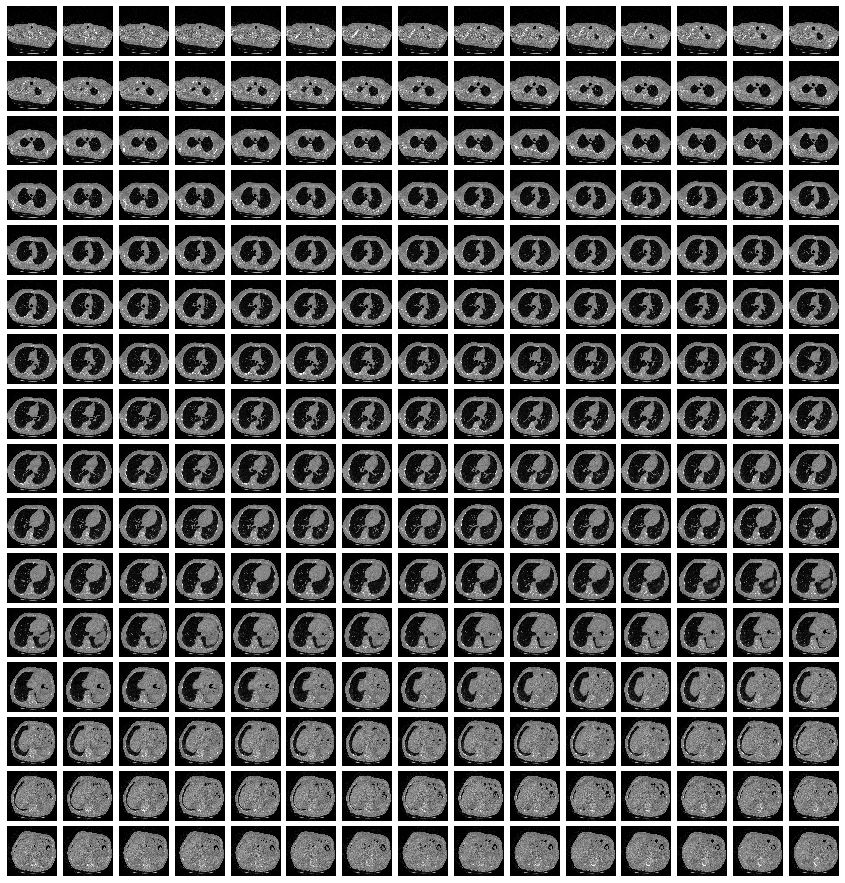

subvol: (6, 64, 64, 32) | 0.00 ~ 1.00


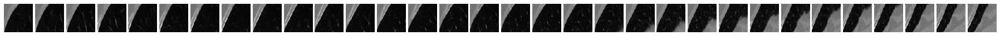

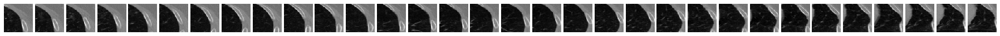

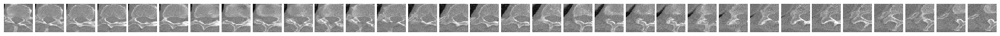

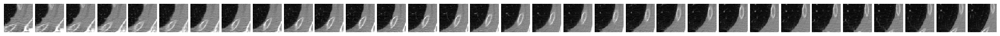

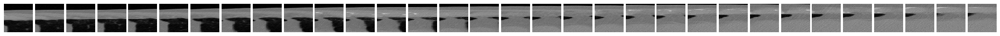

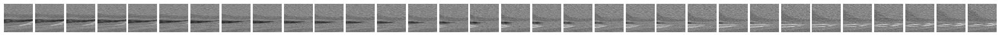

ctpa_data_loader vol: (512, 512, 179) | 0.00 ~ 1.00
ctpa


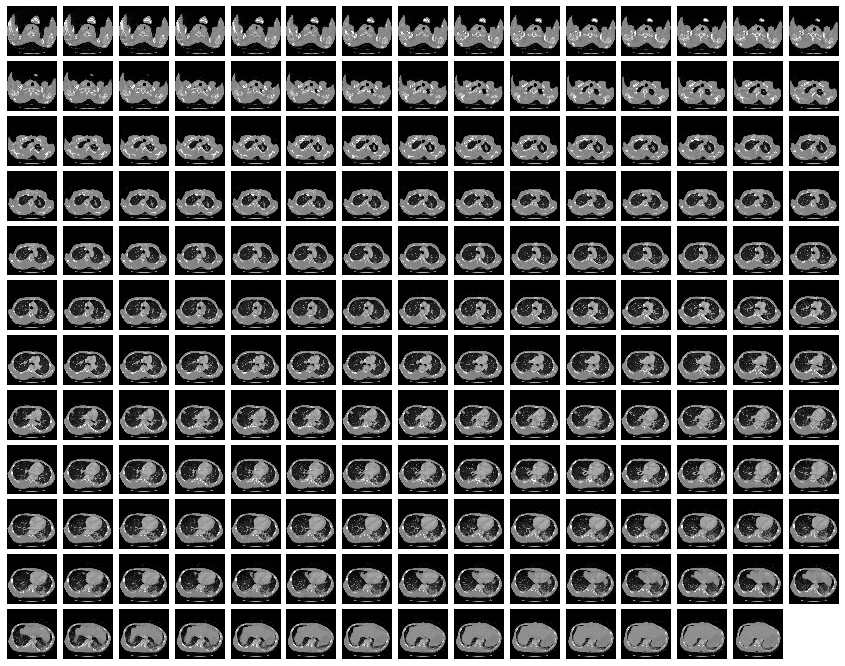

subvol: (6, 64, 64, 32) | 0.00 ~ 1.00


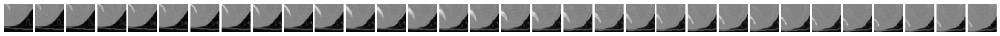

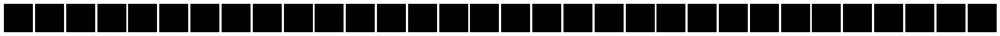

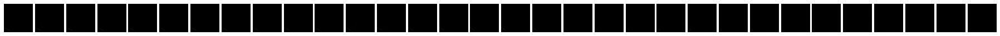

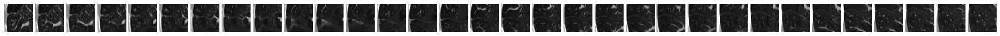

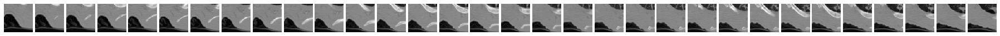

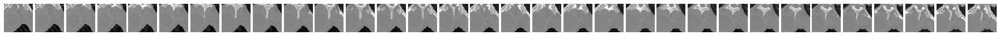

dsb17_data_loader vol: (512, 512, 154) | 0.00 ~ 1.00
dsb17


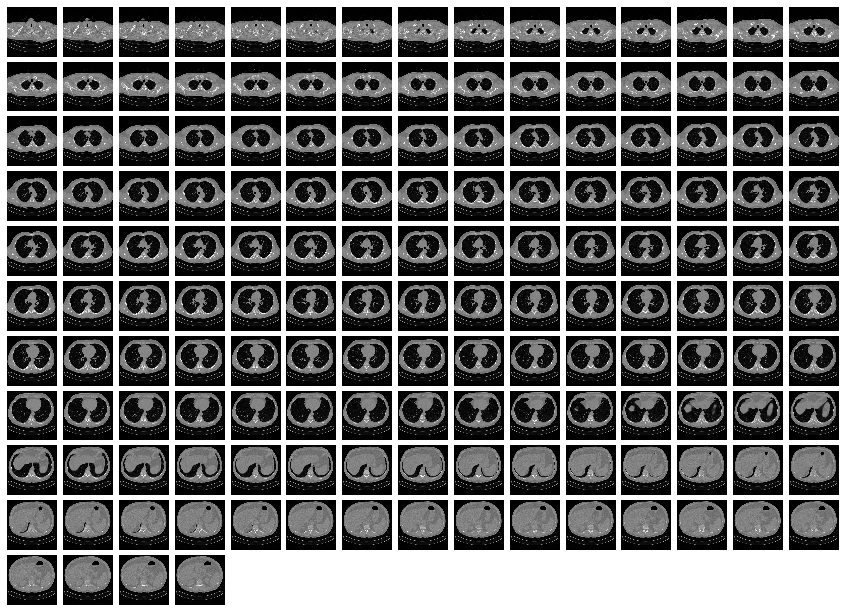

subvol: (6, 64, 64, 32) | 0.00 ~ 1.00


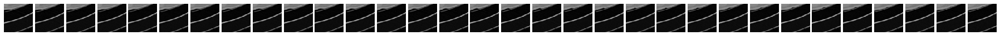

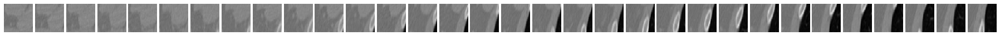

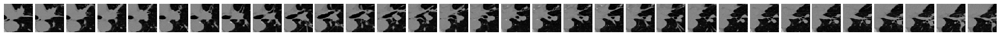

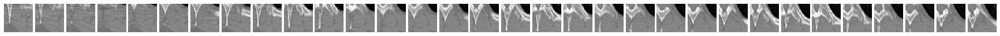

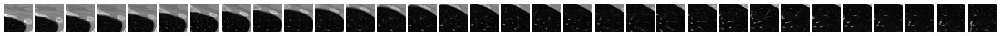

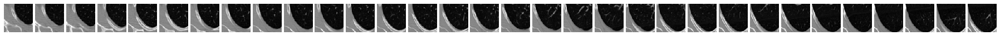

lits17_data_loader vol: (512, 512, 856) | 0.00 ~ 1.00
lits17


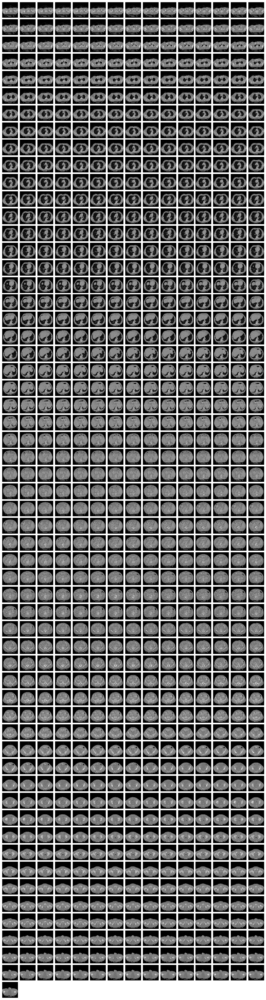

subvol: (6, 64, 64, 32) | 0.00 ~ 0.93


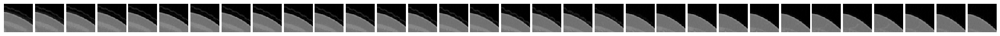

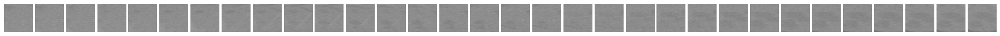

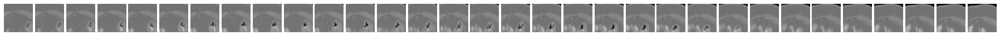

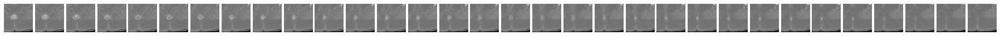

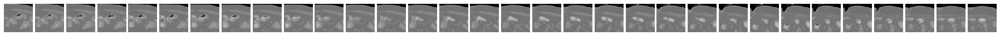

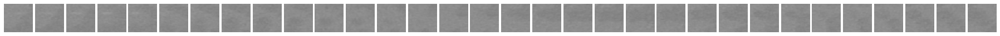

lndb19_data_loader vol: (512, 512, 277) | 0.00 ~ 1.00
lndb19


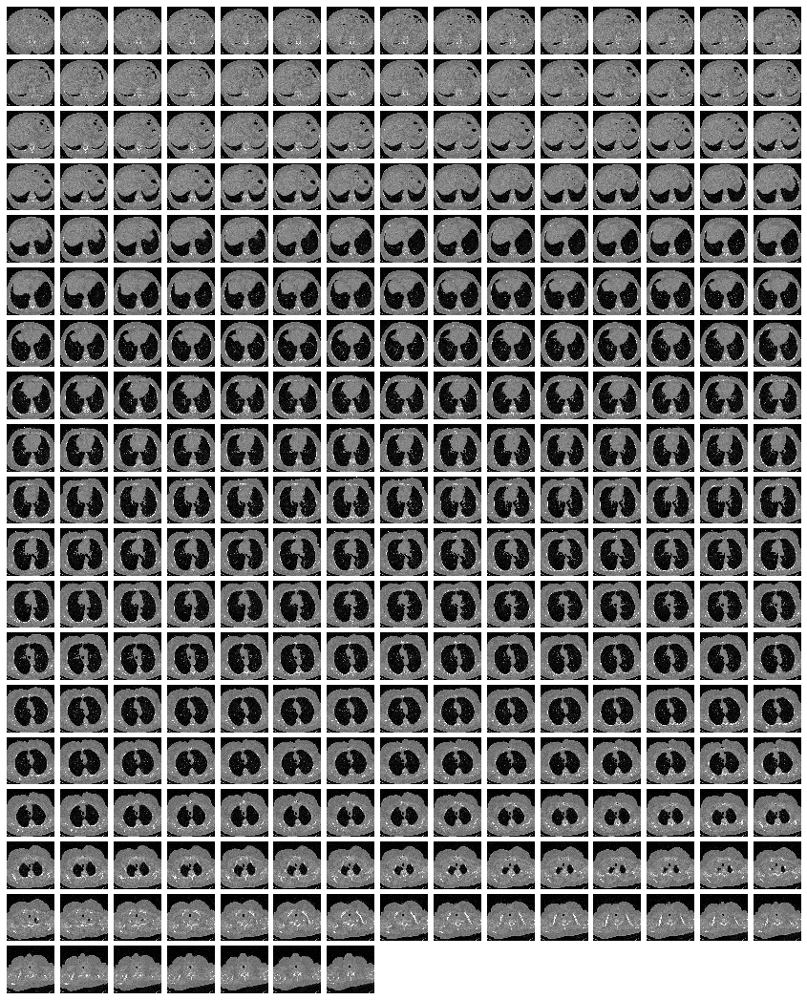

subvol: (6, 64, 64, 32) | 0.00 ~ 1.00


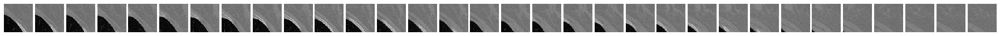

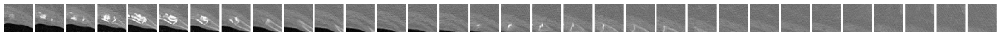

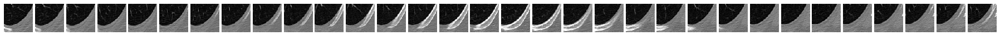

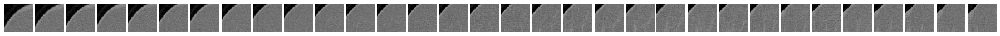

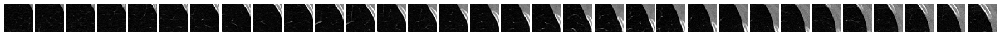

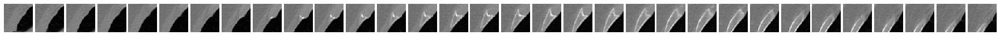

kits19_data_loader vol: (463, 463, 150) | 0.00 ~ 1.00
kits19


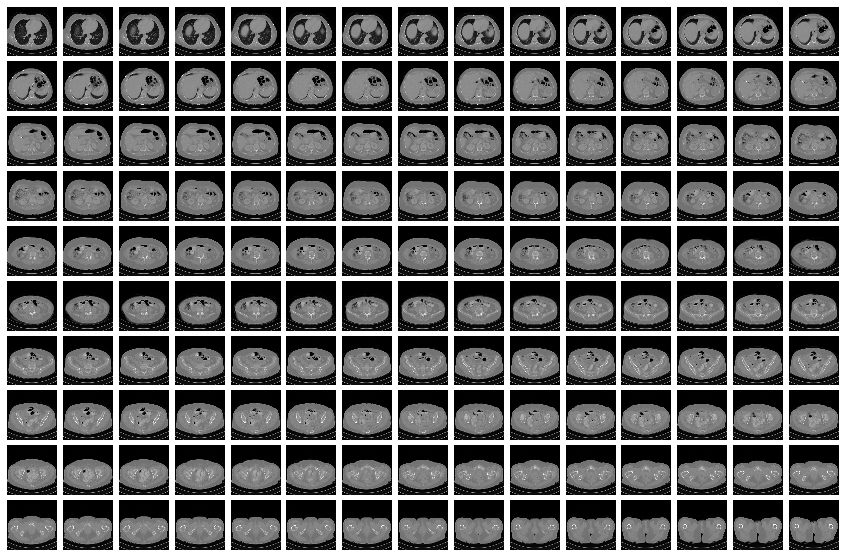

subvol: (6, 64, 64, 32) | 0.00 ~ 0.91


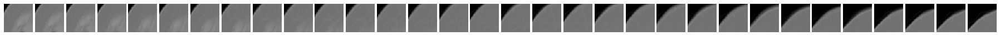

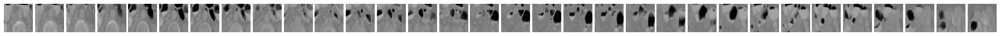

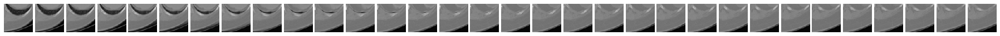

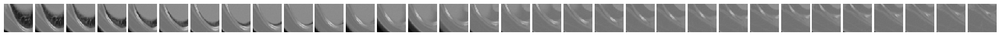

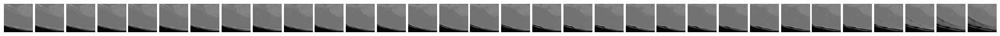

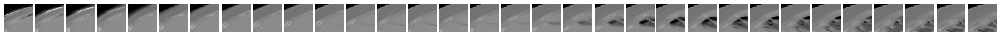

rsnastr20_data_loader vol: (512, 512, 242) | 0.00 ~ 1.00
rsnastr20


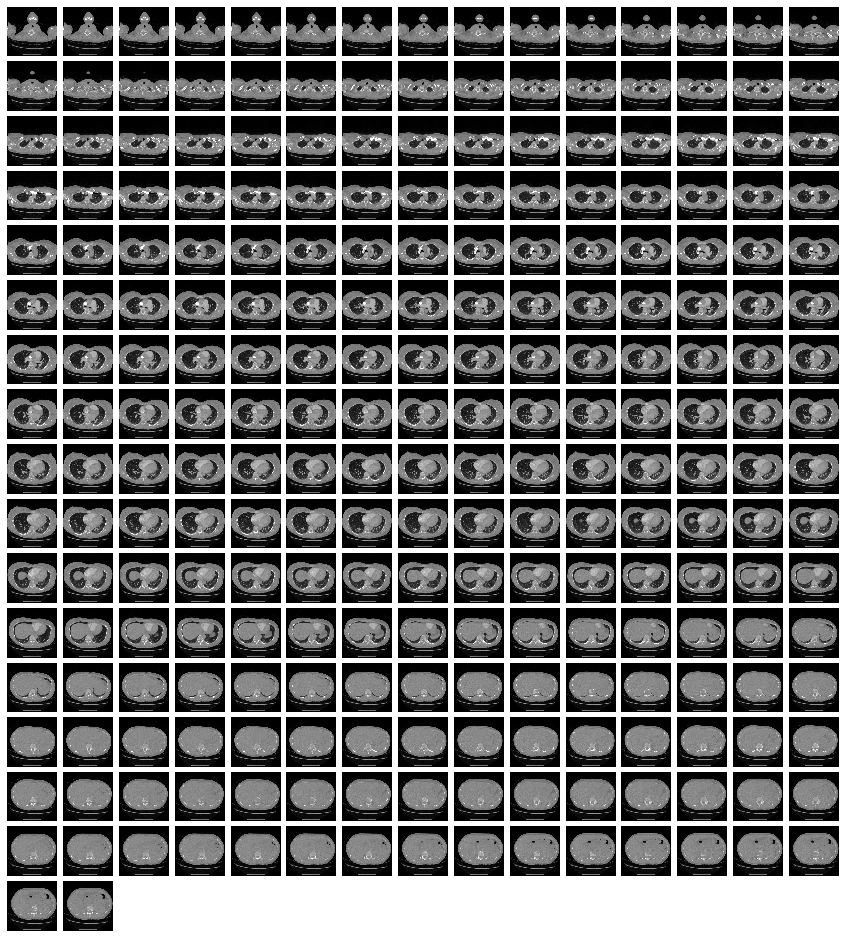

subvol: (6, 64, 64, 32) | 0.00 ~ 0.99


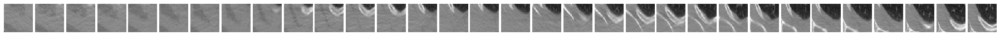

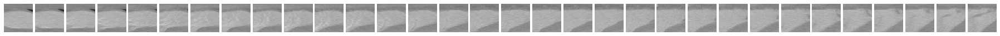

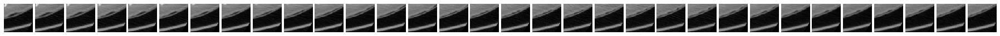

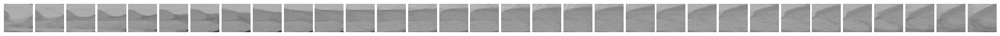

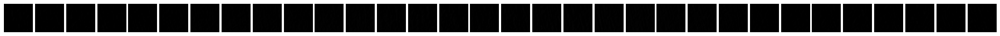

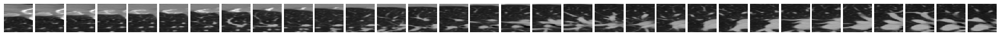

In [2]:
view_ct, view_xray, view_fxray = True, False, False
cols = 32

chest_ct_visualization(view_ct=view_ct, view_xray=view_xray, view_fxray=view_fxray, 
                       data_loader='luna16', config=conf, cols=cols)

chest_ct_visualization(view_ct=view_ct, view_xray=view_xray, view_fxray=view_fxray, 
                       data_loader='ctpa', config=conf, cols=cols)

chest_ct_visualization(view_ct=view_ct, view_xray=view_xray, view_fxray=view_fxray, 
                       data_loader='dsb17', config=conf, cols=cols)

chest_ct_visualization(view_ct=view_ct, view_xray=view_xray, view_fxray=view_fxray, 
                       data_loader='lits17', config=conf, cols=cols)

chest_ct_visualization(view_ct=view_ct, view_xray=view_xray, view_fxray=view_fxray, 
                       data_loader='lndb19', config=conf, cols=cols)

chest_ct_visualization(view_ct=view_ct, view_xray=view_xray, view_fxray=view_fxray, 
                       data_loader='kits19', config=conf, cols=cols)

chest_ct_visualization(view_ct=view_ct, view_xray=view_xray, view_fxray=view_fxray, 
                       data_loader='rsnastr20', config=conf, cols=cols)